# RECCOMENDED LOCATIONS TO OPEN A NEW BEER BAR FOR STANLEY PARK BREWING CO

Data collected on Jun 01, 2021

IBM Capstone Project

## Importing necessary libraries

In [2]:
import pandas as pd
import requests
from bs4 import BeautifulSoup as bs
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import json # library to handle JSON files

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\Fernando Ramos\anaconda3

  added / updated specs:
    - folium=0.5.0


The following packages will be SUPERSEDED by a higher-priority channel:

  conda              pkgs/main::conda-4.10.1-py38haa95532_1 --> conda-forge::conda-4.10.1-py38haa244fe_0


Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done
Solving environment: ...working... done

# All requested packages already installed.



## Scraping data from Wikipedia

This data contains neighbourhood names and postal codes

In [5]:
url = requests.get('https://en.wikipedia.org/w/index.php?title=List_of_postal_codes_of_Canada:_M&oldid=1012118802')

#convert to a beautifulsoup object
soup = bs(url.content)

## Scraping target table

In [7]:
#From HTLM script, table name = "wikitable sortable"
table = soup.find('table', {"class" : "wikitable sortable"})

## Converting a HTML table into a pandas dataframe

In [8]:
df = pd.read_html(str(table))
neighborhood=pd.DataFrame(df[0])
neighborhood.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


## Rows with "Not assigned" values
### Checking if column "Borough" contains "Not assigned" values and column "Neighbourhood" does not contain "Not assigned" values

In [9]:
neighborhood2 = neighborhood[(neighborhood.Borough == 'Not assigned') & (neighborhood.Neighbourhood != 'Not assigned')]
print('Table contains', neighborhood2.shape[0], 'rows(s) with the above condition' )

Table contains 0 rows(s) with the above condition


## Droping rows from column "Borough" with 'Not assigned' values

In [10]:
neighborhood = neighborhood[neighborhood['Borough'] != 'Not assigned']

print('Table contains', neighborhood.shape[0], 'rows and', neighborhood.shape[1], 'columns')
neighborhood.head()

Table contains 103 rows and 3 columns


,Postal Code,Borough,Neighbourhood
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"
5,M6A,North York,"Lawrence Manor, Lawrence Heights"
6,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


## Importing geographical data

Data provided by IBM.

In [11]:
lat_long = pd.read_csv('Geospatial_Coordinates.csv')
lat_long.head(10)

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476
5,M1J,43.744734,-79.239476
6,M1K,43.727929,-79.262029
7,M1L,43.711112,-79.284577
8,M1M,43.716316,-79.239476
9,M1N,43.692657,-79.264848


## Importing data of popular attractions in Tororonto

This data in from Open Data Toronto and contains a field called "Atraction Level", which is a measure of how popular the attraction is. The lower the number, the more attractive the place is. The scale is from 1 to 5.

In [12]:
attraction = pd.read_csv('Places of Interest and Attractions.csv')
attraction_summary = attraction[['NAME','ATTRACTION_LEVEL']]

#Filtering for attraction levels of 1, 2 and 3
attraction_filter = attraction_summary[(attraction_summary['ATTRACTION_LEVEL']==1) | (attraction_summary['ATTRACTION_LEVEL']==2) | (attraction_summary['ATTRACTION_LEVEL']==3)]

attraction_filter.reset_index(drop = True, inplace=True)
attraction_filter.head()

,NAME,ATTRACTION_LEVEL
0,BMO Field,2
1,Aga Khan Museum,1
2,Air Canada Centre,1
3,Allan Gardens,2
4,Alumnae Theatre,3


# Data Preparation

## Joining neighbourhood data and geospatial data using a primary key

In [13]:
merged_df = pd.merge(neighborhood, lat_long, on="Postal Code")
merged_df.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494


## Boroughs that contain the word Toronto

In [14]:
merged_toronto = merged_df[merged_df['Borough'].str.contains('Toronto')].reset_index().drop('index', axis=1)
merged_toronto

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
1,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494
2,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937
3,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418
4,M4E,East Toronto,The Beaches,43.676357,-79.293031
5,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306
6,M5G,Downtown Toronto,Central Bay Street,43.657952,-79.387383
7,M6G,Downtown Toronto,Christie,43.669542,-79.422564
8,M5H,Downtown Toronto,"Richmond, Adelaide, King",43.650571,-79.384568
9,M6H,West Toronto,"Dufferin, Dovercourt Village",43.669005,-79.442259


## Importing json file with spatial data
To build choropleth map later. This data has been transformed into a geojson file and can be found in the Open Data Toronto 

In [15]:
with open('toronto_m.geojson') as data:
    spatial = json.load(data)

In [16]:
CLIENT_ID = 'VY2M1PLSLQIZVA1XAMRIFO1M0YSIKGQQGEIJAPAXE2MWA2K3' # your Foursquare ID
CLIENT_SECRET = 'WUVUBAYDOU2WZKUYPCZNDD4BJWN4ZWNMZTGUQI5124BV3EAJ' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

# Explore Neighborhoods in Toronto

Requesting Foursquare data.

In [17]:
address = 'Toronto, ON'

geolocator = Nominatim(user_agent="to_explorer")
location = geolocator.geocode(address)
neighborhood_latitude = location.latitude
neighborhood_longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(neighborhood_latitude, neighborhood_longitude))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [18]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude',
                  'Venue Category']
    
    return(nearby_venues)

## Neighbourhoods in Toronto

In [19]:
toronto_venues = getNearbyVenues(names=merged_toronto['Neighbourhood'],
                                   latitudes=merged_toronto['Latitude'],
                                   longitudes=merged_toronto['Longitude']
                                  )

Regent Park, Harbourfront
Queen's Park, Ontario Provincial Government
Garden District, Ryerson
St. James Town
The Beaches
Berczy Park
Central Bay Street
Christie
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
The Danforth West, Riverdale
Toronto Dominion Centre, Design Exchange
Brockton, Parkdale Village, Exhibition Place
India Bazaar, The Beaches West
Commerce Court, Victoria Hotel
Studio District
Lawrence Park
Roselawn
Runnymede, The Junction, Weston-Pellam Park, Carlton Village
Davisville North
Forest Hill North & West, Forest Hill Road Park
High Park, The Junction South
North Toronto West, Lawrence Park
The Annex, North Midtown, Yorkville
Parkdale, Roncesvalles
Davisville
University of Toronto, Harbord
Runnymede, Swansea
Moore Park, Summerhill East
Kensington Market, Chinatown, Grange Park
Summerhill West, Rathnelly, South Hill, Forest Hill SE, Deer Park
CN Tower, King and Spadina, Railway Lands, Harb

In [20]:
toronto_venues.shape

(3171, 7)

# Data Exploration

## Map of toronto

Markers indicate neighbourhoods center points

In [19]:
# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(merged_toronto['Latitude'], merged_toronto['Longitude'], merged_toronto['Borough'], merged_toronto['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

## Analyze Each Neighborhood

In [21]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighbourhood'] = toronto_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]


toronto_onehot.head()

,Neighbourhood,Accessories Store,Adult Boutique,Afghan Restaurant,Airport,American Restaurant,Amphitheater,Animal Shelter,Aquarium,Arcade,...,University,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo
0,"Regent Park, Harbourfront",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"Regent Park, Harbourfront",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Regent Park, Harbourfront",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Regent Park, Harbourfront",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"Regent Park, Harbourfront",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
toronto_onehot.shape

(3171, 269)

## Number of beer bars per neighbourhood

In [23]:
df_beer = toronto_onehot.groupby("Neighbourhood").sum()[['Beer Bar']]
df_beer.reset_index(inplace=True)
df_beer

,Neighbourhood,Beer Bar
0,Berczy Park,3
1,"Brockton, Parkdale Village, Exhibition Place",1
2,"Business reply mail Processing Centre, South C...",0
3,"CN Tower, King and Spadina, Railway Lands, Har...",0
4,Central Bay Street,0
5,Christie,0
6,Church and Wellesley,0
7,"Commerce Court, Victoria Hotel",3
8,Davisville,0
9,Davisville North,0


## Finding the respective postal codes for each neighbourhood

In [32]:
beer = pd.merge(df_beer, merged_toronto[['Neighbourhood','Postal Code']], on='Neighbourhood',how='inner')
beer.rename(columns={'Beer Bar': 'Beer Bar Count'},inplace = True)
beer

,Neighbourhood,Beer Bar Count,Postal Code
0,Berczy Park,3,M5E
1,"Brockton, Parkdale Village, Exhibition Place",1,M6K
2,"Business reply mail Processing Centre, South C...",0,M7Y
3,"CN Tower, King and Spadina, Railway Lands, Har...",0,M5V
4,Central Bay Street,0,M5G
5,Christie,0,M6G
6,Church and Wellesley,0,M4Y
7,"Commerce Court, Victoria Hotel",3,M5L
8,Davisville,0,M4S
9,Davisville North,0,M4P


## Merging toronto_venues and attractions table to find in which neighbourhoods the attractions are located

In [25]:
df_merged = pd.merge(toronto_venues, attraction_filter, left_on="Venue", right_on='NAME')
df_merged.drop(['NAME'],axis='columns',inplace=True)
df_merged.reset_index(drop = True, inplace=True)
df_merged.head()

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,ATTRACTION_LEVEL
0,"Regent Park, Harbourfront",43.654260,-79.360636,The Distillery Historic District,43.650244,-79.359323,Historic Site,1
1,"Regent Park, Harbourfront",43.654260,-79.360636,Young Centre for the Performing Arts,43.650825,-79.357593,Performing Arts Venue,3
2,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,Royal Conservatory of Music,43.668228,-79.396311,Music School,2
3,"The Annex, North Midtown, Yorkville",43.672710,-79.405678,Royal Conservatory of Music,43.668228,-79.396311,Music School,2
4,"University of Toronto, Harbord",43.662696,-79.400049,Royal Conservatory of Music,43.668228,-79.396311,Music School,2


## Merging dataframe containing attractions with dataframe containing postal codes

To build folium map later

In [26]:
df_geo = pd.merge(merged_toronto[['Neighbourhood','Postal Code']], df_merged, on='Neighbourhood',how='inner')

df_geo.head()

,Neighbourhood,Postal Code,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,ATTRACTION_LEVEL
0,"Regent Park, Harbourfront",M5A,43.654260,-79.360636,The Distillery Historic District,43.650244,-79.359323,Historic Site,1
1,"Regent Park, Harbourfront",M5A,43.654260,-79.360636,Young Centre for the Performing Arts,43.650825,-79.357593,Performing Arts Venue,3
2,"Queen's Park, Ontario Provincial Government",M7A,43.662301,-79.389494,Royal Conservatory of Music,43.668228,-79.396311,Music School,2
3,"Queen's Park, Ontario Provincial Government",M7A,43.662301,-79.389494,Royal Ontario Museum,43.668367,-79.394813,Museum,1
4,"Queen's Park, Ontario Provincial Government",M7A,43.662301,-79.389494,Art Gallery of Ontario,43.654003,-79.392922,Art Gallery,1


## Number of popular attractions per neighbourhood

In [36]:
pop_attr = df_geo.groupby(['Neighbourhood','Postal Code']).count()[['Venue']]
pop_attr.rename(columns={'Venue': 'Attraction Count'},inplace = True)
pop_attr.reset_index(inplace=True)
pop_attr

,Neighbourhood,Postal Code,Attraction Count
0,"Brockton, Parkdale Village, Exhibition Place",M6K,1
1,"CN Tower, King and Spadina, Railway Lands, Har...",M5V,1
2,Central Bay Street,M5G,4
3,Christie,M6G,1
4,Church and Wellesley,M4Y,1
5,"Commerce Court, Victoria Hotel",M5L,2
6,"First Canadian Place, Underground city",M5X,4
7,"Garden District, Ryerson",M5B,3
8,"Harbourfront East, Union Station, Toronto Islands",M5J,7
9,"India Bazaar, The Beaches West",M4L,1


In [38]:
pop = pop_attr.loc[pop_attr['Attraction Count']>=4]
for i in pop['Neighbourhood']:
    print(i)
    print('\n')

Central Bay Street


First Canadian Place, Underground city


Harbourfront East, Union Station, Toronto Islands


Queen's Park, Ontario Provincial Government


Richmond, Adelaide, King


The Annex, North Midtown, Yorkville


Toronto Dominion Centre, Design Exchange




The neighbourhoods above have the highest number of popular attractions

## Distribution of Beer Bars in Toronto

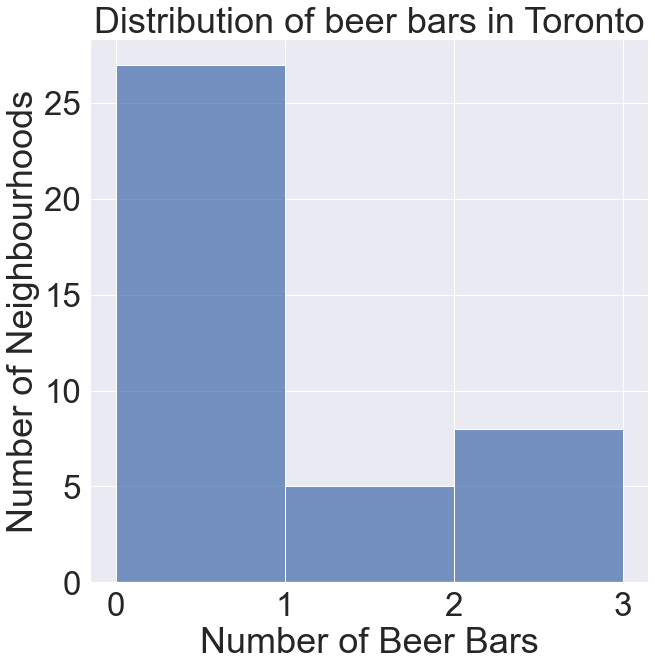

In [82]:
plt.figure(figsize=(10,10))
sns.histplot(data=beer, x="Beer Bar Count", bins = np.arange(0,4,1))
plt.xticks(np.arange(0,4,1))
plt.xlabel('Number of Beer Bars')
plt.ylabel('Number of Neighbourhoods')
plt.title('Distribution of beer bars in Toronto')
plt.show()

Most neighbourhoods in Toronto, approximately 26, do not have a beer bar. 5 neighbourhoods have 1 to 2 beer bars and 6 neighbourhoods have 2 to 3 beer bars. Figure 2 shows the number of beer bars only in neighbourhoods that have beer bars

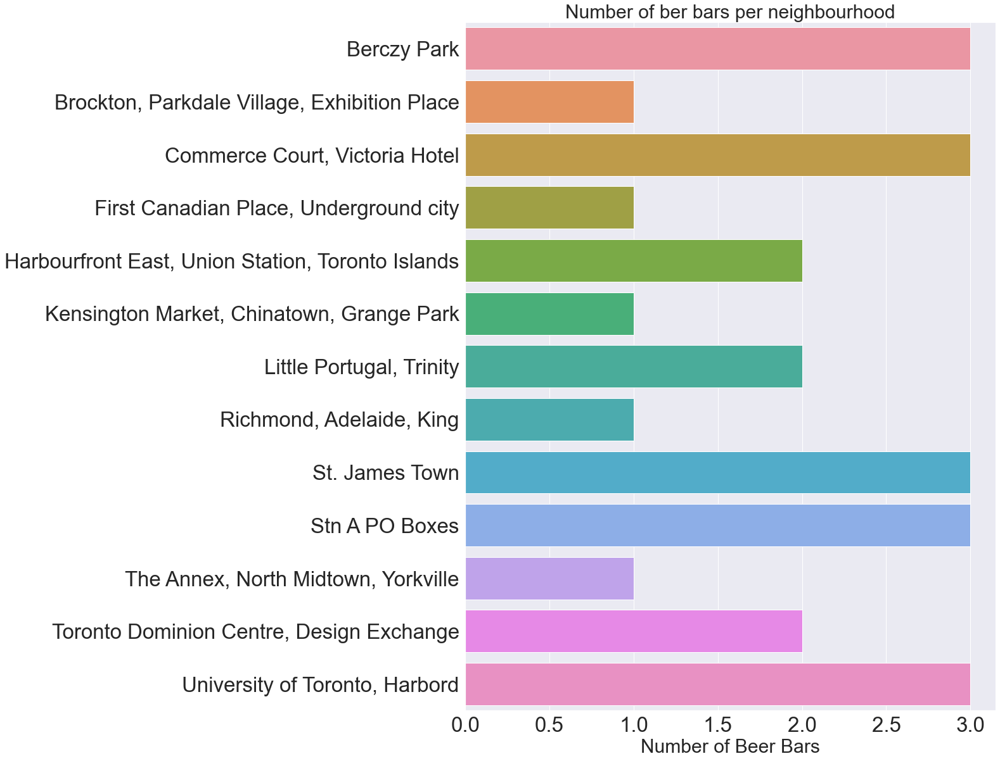

In [83]:
plt.figure(figsize=(15,20))
sns.barplot(x="Beer Bar Count", y="Neighbourhood", data=beer.loc[beer['Beer Bar Count']!=0])
sns.set(font_scale = 3)
plt.xlabel('Number of Beer Bars', fontsize=30)
plt.ylabel('')
plt.title('Number of ber bars per neighbourhood', fontsize=30)
plt.show()

In [34]:
beer_bar = beer.loc[beer['Beer Bar Count']==3]
for i in beer_bar['Neighbourhood']:
    print(i)
    print('\n')

Berczy Park


Commerce Court, Victoria Hotel


St. James Town


Stn A PO Boxes


University of Toronto, Harbord




Neighbourhoods above have the highest number of beer bars and are more competitive for a new beer bar.The largest count of beer bars in the data set was 3. University of Toronto, Harbord, has a high count possibly due to higher number of young people in the neighbourhood that study in the university

## Distribution of Beer Bars on a map

In [62]:
import folium

m = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=10)

m.choropleth(
    geo_data=spatial,
    name="choropleth",
    data=beer,
    columns=["Postal Code", "Beer Bar Count"],
    key_on="feature.properties.CFSAUID",
    fill_color="Paired",
    fill_opacity=0.5,
    line_opacity=0.4,
    legend_name="Number of Beer Bars")


m.save("index.html")
m

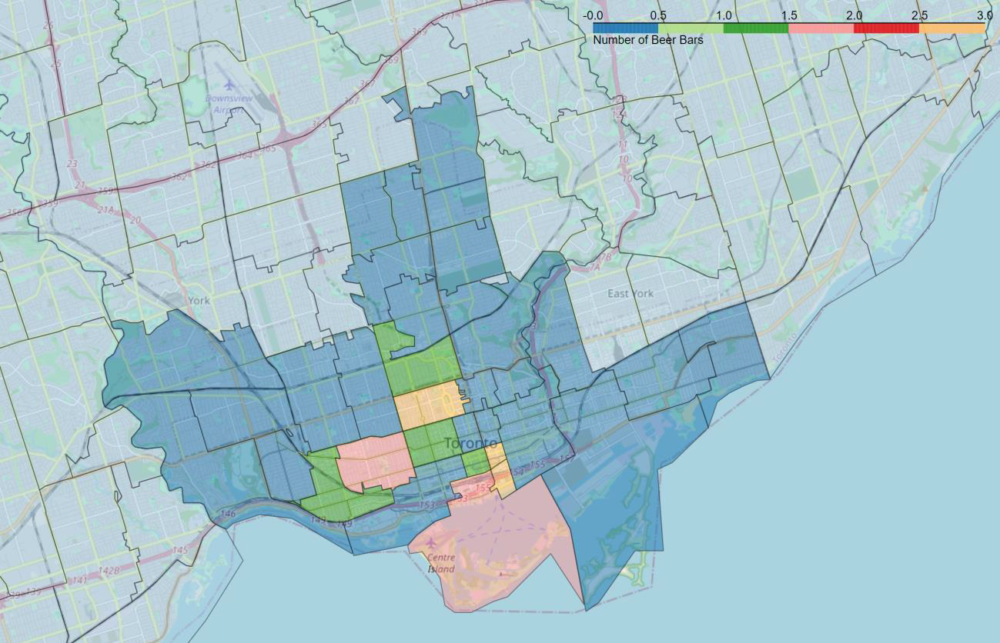

Number of beers bars increase towards the lake and around University of Toronto

## Merging tables together to find which neighbourhoods containing popular attractions also have beer bars

Created a measure called "Proportion". This measure relates the number of attractions per Beer Bar in each neighbourhood, which is an indication of the proportion of people who visit the attraction would also visit the beer bars.

In [29]:
beer = pd.merge(beer, pop_attr[['Neighbourhood','Attraction Count']], on='Neighbourhood',how='inner')
#beer['Proportion']=beer['Beer Bar Count']/beer['Attraction Count']
beer.reset_index(drop = True, inplace=True)
beer

,Neighbourhood,Beer Bar Count,Postal Code,Attraction Count
0,"Brockton, Parkdale Village, Exhibition Place",1,M6K,1
1,"CN Tower, King and Spadina, Railway Lands, Har...",0,M5V,1
2,Central Bay Street,0,M5G,4
3,Christie,0,M6G,1
4,Church and Wellesley,0,M4Y,1
5,"Commerce Court, Victoria Hotel",3,M5L,2
6,"First Canadian Place, Underground city",1,M5X,4
7,"Garden District, Ryerson",0,M5B,3
8,"Harbourfront East, Union Station, Toronto Islands",2,M5J,7
9,"India Bazaar, The Beaches West",0,M4L,1


In [66]:
m2 = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=10)

m2.choropleth(
    geo_data=spatial,
    name="choropleth",
    data=beer,
    columns=["Postal Code", "Attraction Count"],
    key_on="feature.properties.CFSAUID",
    fill_color="Paired",
    fill_opacity=0.5,
    line_opacity=0.4,
    legend_name="Number of popular attractions")


m2.save("index2.html")
m2

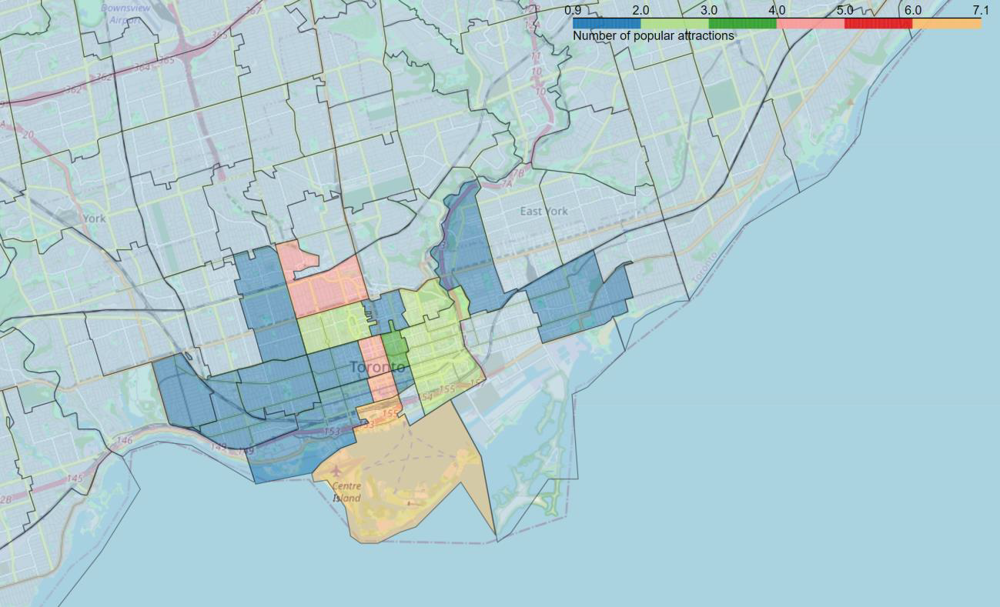

Neighbourhoods coloured in orange have higher number of attractions

In [85]:
beer2=beer.copy()
#beer2.drop(['Venue','Beer Bar','Postal Code'],axis='columns',inplace=True)
beer2.drop(['Postal Code'],axis='columns',inplace=True)
beer2.reset_index(drop = True, inplace=True)
beer2.head()

,Neighbourhood,Beer Bar Count,Attraction Count
0,"Brockton, Parkdale Village, Exhibition Place",1,1
1,"CN Tower, King and Spadina, Railway Lands, Har...",0,1
2,Central Bay Street,0,4
3,Christie,0,1
4,Church and Wellesley,0,1


## Using K-means to group neighbourhoods

### Determining the best k

In [86]:
# set number of clusters
kclusters = 4

toronto_grouped_clustering = beer2.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 1, 0, 0, 2, 1, 1, 3, 0])

C:\Users\Fernando Ramos\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Text(0, 0.5, 'WCSS')

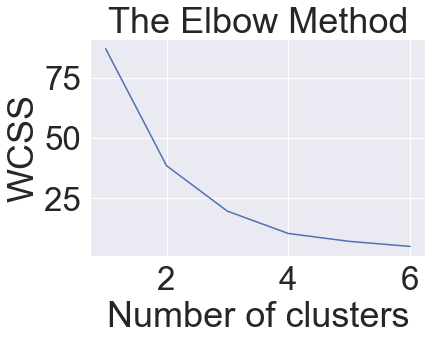

In [69]:
wcss=[]
for i in range(1,7):
    kmeans = KMeans(i)
    kmeans.fit(toronto_grouped_clustering)
    wcss_iter = kmeans.inertia_
    wcss.append(wcss_iter)

number_clusters = range(1,7)
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

Ideal number of clusters is 4!

In [87]:
# add clustering labels
beer.insert(0, 'Cluster Labels', kmeans.labels_)

toronto_merged = df_merged

# merge toronto_merged with beer to add latitude/longitude for each neighborhood
#toronto_merged=pd.merge(toronto_merged, beer, on='Neighbourhood',how='inner')
toronto_merged = toronto_merged.join(beer.set_index('Neighbourhood'), on='Neighbourhood')

toronto_merged

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,ATTRACTION_LEVEL,Cluster Labels,Beer Bar Count,Postal Code,Attraction Count
0,"Regent Park, Harbourfront",43.654260,-79.360636,The Distillery Historic District,43.650244,-79.359323,Historic Site,1,0,0,M5A,2
1,"Regent Park, Harbourfront",43.654260,-79.360636,Young Centre for the Performing Arts,43.650825,-79.357593,Performing Arts Venue,3,0,0,M5A,2
2,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,Royal Ontario Museum,43.668367,-79.394813,Museum,1,1,0,M7A,4
3,"The Annex, North Midtown, Yorkville",43.672710,-79.405678,Royal Ontario Museum,43.668367,-79.394813,Museum,1,1,1,M5R,4
4,"University of Toronto, Harbord",43.662696,-79.400049,Royal Ontario Museum,43.668367,-79.394813,Museum,1,2,3,M5S,2
5,Church and Wellesley,43.665860,-79.383160,Royal Ontario Museum,43.668367,-79.394813,Museum,1,0,0,M4Y,1
6,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,Royal Conservatory of Music,43.668228,-79.396311,Music School,2,1,0,M7A,4
7,"The Annex, North Midtown, Yorkville",43.672710,-79.405678,Royal Conservatory of Music,43.668228,-79.396311,Music School,2,1,1,M5R,4
8,"University of Toronto, Harbord",43.662696,-79.400049,Royal Conservatory of Music,43.668228,-79.396311,Music School,2,2,3,M5S,2
9,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,Art Gallery of Ontario,43.654003,-79.392922,Art Gallery,1,1,0,M7A,4


## Visualizing clusters

In [88]:
# create map
map_clusters = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=11)

map_clusters.choropleth(
    geo_data=spatial,
    name="choropleth",
    data=beer,
    columns=["Postal Code", "Beer Bar Count"],
    key_on="feature.properties.CFSAUID",
    fill_color="YlOrBr",
    fill_opacity=0.5,
    line_opacity=0.4,
    legend_name="Beer Bar Count")

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Neighborhood Latitude'], toronto_merged['Neighborhood Longitude'], toronto_merged['Neighbourhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

map_clusters.save("index3.html")   
map_clusters

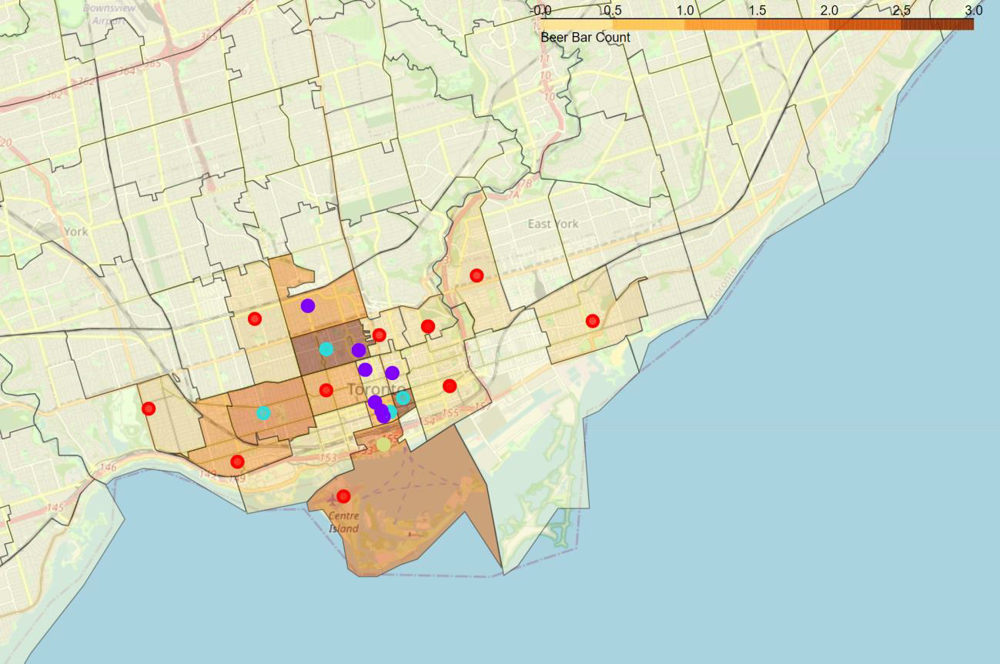

According to the color scale, dark brown represents the are with highest largest number of beer bars, followed by light brown, orange and light yellow. Markers coloured in purple represent locations that have relatively high number of popular attractions and relatively low number of beer bars compared to those coloured in red, green, and yellow.

## Getting a glympse of each cluster

For a small dataset such as this one, we can simply slice the dataframe into the different clusters and see how the data was clustered

In [89]:
list1 = toronto_merged.columns[1:8].tolist()
list2 = [toronto_merged.columns[10]]
listf = list1 + list2
listf

['Neighborhood Latitude',
 'Neighborhood Longitude',
 'Venue',
 'Venue Latitude',
 'Venue Longitude',
 'Venue Category',
 'ATTRACTION_LEVEL',
 'Postal Code']

In [90]:
#removing duplicates
toronto_merged2=toronto_merged.copy()
toronto_merged2.drop_duplicates('Neighbourhood', keep='last',inplace=True)
toronto_merged2.reset_index(drop = True, inplace=True)
toronto_merged2.drop(listf,axis='columns',inplace=True)

toronto_merged2.head()

,Neighbourhood,Cluster Labels,Beer Bar Count,Attraction Count
0,"Regent Park, Harbourfront",0,0,2
1,Church and Wellesley,0,0,1
2,"University of Toronto, Harbord",2,3,2
3,"Kensington Market, Chinatown, Grange Park",0,1,1
4,"Queen's Park, Ontario Provincial Government",1,0,4


In [91]:
toronto_merged2.loc[toronto_merged2['Cluster Labels']==3]


,Neighbourhood,Cluster Labels,Beer Bar Count,Attraction Count
13,"Harbourfront East, Union Station, Toronto Islands",3,2,7


In [92]:
toronto_merged2.loc[toronto_merged2['Cluster Labels']==1]


,Neighbourhood,Cluster Labels,Beer Bar Count,Attraction Count
4,"Queen's Park, Ontario Provincial Government",1,0,4
6,"Garden District, Ryerson",1,0,3
7,Central Bay Street,1,0,4
10,"Richmond, Adelaide, King",1,1,5
11,"Toronto Dominion Centre, Design Exchange",1,2,4
12,"First Canadian Place, Underground city",1,1,4
18,"The Annex, North Midtown, Yorkville",1,1,4


In [93]:
toronto_merged2.loc[toronto_merged2['Cluster Labels']==0]

,Neighbourhood,Cluster Labels,Beer Bar Count,Attraction Count
0,"Regent Park, Harbourfront",0,0,2
1,Church and Wellesley,0,0,1
3,"Kensington Market, Chinatown, Grange Park",0,1,1
8,Christie,0,0,1
15,"The Danforth West, Riverdale",0,0,1
16,"Brockton, Parkdale Village, Exhibition Place",0,1,1
17,"India Bazaar, The Beaches West",0,0,1
19,"Parkdale, Roncesvalles",0,0,1
20,"CN Tower, King and Spadina, Railway Lands, Har...",0,0,1
21,"St. James Town, Cabbagetown",0,0,2


In [94]:
toronto_merged2.loc[toronto_merged2['Cluster Labels']==2]

,Neighbourhood,Cluster Labels,Beer Bar Count,Attraction Count
2,"University of Toronto, Harbord",2,3,2
5,St. James Town,2,3,1
9,"Commerce Court, Victoria Hotel",2,3,2
14,"Little Portugal, Trinity",2,2,1


## List of neighbourhood with relatively less competition (cluster #0)

In [95]:
recomm_neigh = toronto_merged2.loc[toronto_merged2['Cluster Labels']==1]
list_neigh = recomm_neigh['Neighbourhood'].unique()
for neigh in list_neigh:
    print(neigh)
    print('\n')

Queen's Park, Ontario Provincial Government


Garden District, Ryerson


Central Bay Street


Richmond, Adelaide, King


Toronto Dominion Centre, Design Exchange


First Canadian Place, Underground city


The Annex, North Midtown, Yorkville




# Conclusion

Based on the measure "Proportion", is an indication of the proportion of people who visit the attraction would also visit the beer bars, neighbourhoods coloured in purple have popular attractions as less competition compered to those coloured in red and green. Recommended neighbourhoods are:

- Queen's Park, Ontario Provincial Government
- Garden District, Ryerson
- Central Bay Street
- Richmond, Adelaide, King
- Toronto Dominion Centre, Design Exchange
- First Canadian Place, Underground city
- The Annex, North Midtown, Yorkville

Cluster #3, which represents neighbourhood Harbourfront East, Union Station, Toronto Islands, is also recommended due to the high number of popular attractions, 7 in total, despite having the second highest number of beer bars in the region, 2 in total.